### imports

In [12]:
from data_preprocessing import decompress_pickle
from pandas_profiling import ProfileReport 
import seaborn as sns


### get data

In [13]:
ori_br = decompress_pickle("../data/BikeRental.pbz2")

## normalization

### which features are to be normalized?

##### all real-valued non-categorical features
##### note: the following features are said to be  normalized already: temp, atemp, hum, windspeed 
##### do not normalize categorical features
##### normalize casual
##### normalize registered
##### normalize cnt

In [11]:
profile = ProfileReport(ori_br, title='Bike Share Rental Pandas Profiling Report', explorative = True)

profile

##### note: windspeed was not correctly normalized

##### normalize windspeed
##### normalize casual
##### normalize registered
##### normalize cnt

## note: I'm unsure about normalizing the feature to predict (cnt), but it's easy to de-normalize

### normalization

In [5]:
from sklearn import preprocessing

In [7]:
mm_scaler = preprocessing.MinMaxScaler()

In [4]:
cols_to_norm = ['windspeed','casual', 'registered', 'cnt']


In [ ]:
norm_br = ori_br
norm_br[cols_to_norm] = mm_scaler.fit_transform(ori_br[cols_to_norm])

In [21]:
profile = ProfileReport(norm_br, title='Bike Share Rental Pandas Profiling Report', explorative = True)

profile

## outliers

### find outliers (among normalized features)

In [18]:
col_boxplot = ['temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt']

### unnormalized

<AxesSubplot:>

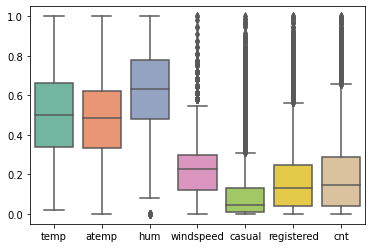

In [19]:
sns.boxplot(data=ori_br[col_boxplot], orient="v", palette="Set2")

<AxesSubplot:>

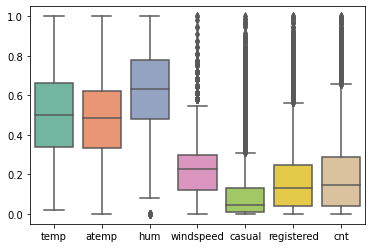

In [22]:
sns.boxplot(data=norm_br[col_boxplot], orient="v", palette="Set2")

### normalized

### deal with outliers